In [23]:
import os

os.getcwd()

'/mnt/Omics2/zhouxk/DL_IN_Plant/SEI/experiment/model/code'

In [3]:
import torch
import numpy as np
import utils
import data
import preprocess
import pandas as pd

record_pattern = 'sei_seq{}_nip_feature{}'.format(1024, 467)
suffix = ''

In [3]:
# prediction
import sei_model as sei

prediction_fa = '../genome/osat_1k_128s_filtered.fa'

## Note: This is indepent param
model_dir = '../model/{}.model'.format(record_pattern)

## Restart varibles which will be cleared
batch_size=512
device = torch.device("cuda:1" if torch.cuda.is_available() else "cpu")
cpu = torch.device('cpu')
tag_file = '../training/osat_training_taglist.txt'
with open(tag_file) as f:
    tag_list = f.readlines()

In [4]:
model = torch.load(model_dir, map_location={'cuda:0':'cuda:1'})
model.eval()

tag_dict = { item.strip():index for index, item in enumerate(tag_list) }
nfeature = len(tag_dict)
total_pre = torch.tensor([[0]*nfeature],dtype=torch.float)


pre_seqs = utils.load_data(prediction_fa)
print('Total {} seqs from {}'.format(len(pre_seqs), prediction_fa))

pre_nuc_pre = preprocess.NucPreprocess(pre_seqs)
pre_X_all = pre_nuc_pre.onehot_for_nuc()
print('Encoding done')

pre_dataset = data.NucDataset(x=pre_X_all, y=[0]*len(pre_X_all))
pre_loader = torch.utils.data.DataLoader(dataset=pre_dataset, batch_size=batch_size, shuffle=False, num_workers=0)

with torch.no_grad():
    print('Start prediction, total: ', len(pre_X_all))
    for i, (inputs, _) in enumerate(pre_loader):
        inputs = inputs.to(device, dtype=torch.float)
        inputs = inputs.permute(0,2,1)
        outputs = model(inputs)
        outputs = outputs.squeeze()
        total_pre = torch.concat((total_pre, outputs.to(cpu, dtype=torch.float)))
        if i%5000 == 0:
            print(i, i/len(pre_loader))

total_pre = total_pre[1:].numpy()
np.save('../prediction/predicted_matrix_{}{}.npy'.format(record_pattern, suffix),total_pre)

Total 2920445 seqs from ../genome/osat_1k_128s_filtered.fa
Encoding done
Start prediction, total:  2920445


//mnt/Omics2/zhouxk/anaconda3/envs/ML/lib/python3.9/site-packages/torch/nn/modules/conv.py:309: UserWarning: Applied workaround for CuDNN issue, install nvrtc.so (Triggered internally at /opt/conda/conda-bld/pytorch_1682343997789/work/aten/src/ATen/native/cudnn/Conv_v8.cpp:80.)


0 0.0
5000 0.876577840112202


In [5]:
total_pre.shape

(2920445, 467)

>**Can run seperate**

In [12]:
#PCA降维
from sklearn.decomposition import IncrementalPCA

total_pre = np.load('../prediction/predicted_matrix_{}{}.npy'.format(record_pattern, suffix))
PCA_transformer = IncrementalPCA(n_components=100, batch_size=100000)
PCA_pre = PCA_transformer.fit_transform(total_pre)
PCA_pre.shape
np.save('../visualization/{}_IPCA_100{}'.format(record_pattern, suffix), PCA_pre)

In [13]:
PCA_ratio_threshold = 1e-4

PCA_threshold = len(PCA_transformer.explained_variance_ratio_[PCA_transformer.explained_variance_ratio_>=PCA_ratio_threshold])

In [14]:
import pandas as pd

top_pca = PCA_transformer.explained_variance_ratio_[:20]

pca_ratio = pd.DataFrame(np.vstack((np.arange(len(top_pca)),top_pca)))
pca_ratio = pca_ratio.T
pca_ratio.columns = ['X','Y']
pca_ratio

,X,Y
0,0.0,0.554917
1,1.0,0.163741
2,2.0,0.100981
3,3.0,0.061142
4,4.0,0.029790
5,5.0,0.020767
6,6.0,0.009491
7,7.0,0.007044
8,8.0,0.005658
9,9.0,0.005142


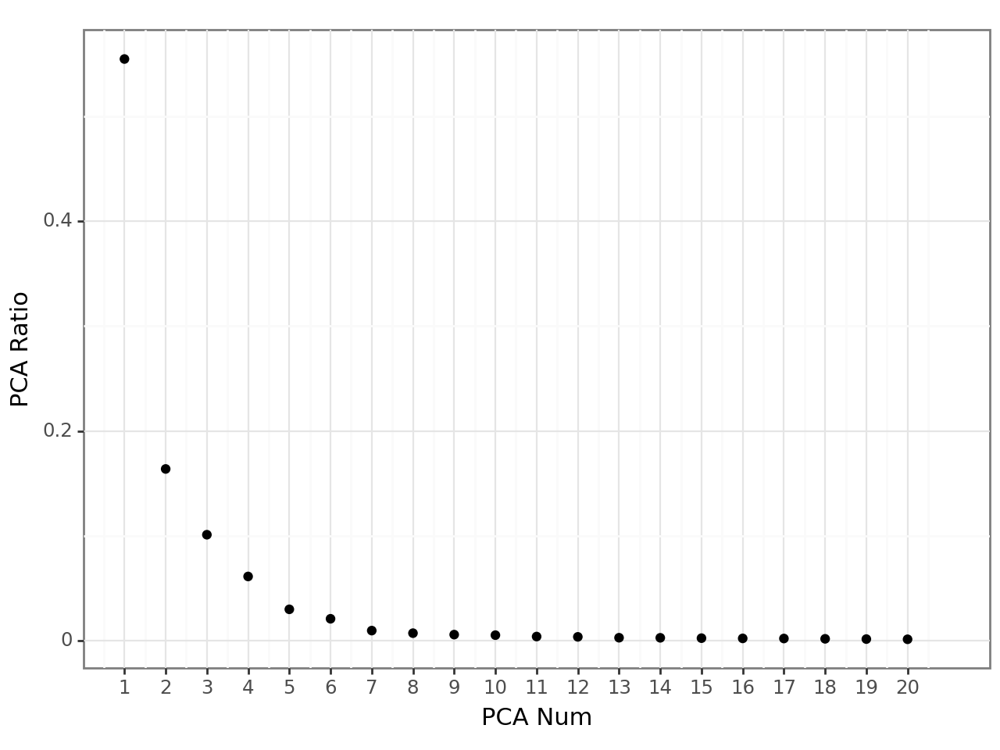

<Figure Size: (640 x 480)>

In [15]:
from plotnine import *
p = (ggplot(pca_ratio, aes(x='X',y='Y'))+geom_point()+theme_bw()+scale_x_continuous(limits=[0,20], breaks=list(range(0, 20)), labels = list(range(1,21)))+ylab('PCA Ratio')+xlab('PCA Num'))
p

In [29]:
PCA_pre = np.load('../visualization/{}_IPCA_100{}.npy'.format(record_pattern, suffix))

PCA_threshold = 9

pcadata = PCA_pre[:,:PCA_threshold]
pcadata.shape

(1460227, 9)

In [30]:
# lovain -> leiden

import nmslib
import numpy as np
import leidenalg
import igraph as ig
from scipy.sparse import csgraph, csr_matrix

def knn_graph(X, n_neighbors=15, space='l2', num_threads=8, params={'post': 2}):
    """    space: string
            The metric/non-metric distance functions to use to compute distances.
            see https://github.com/nmslib/nmslib/blob/master/manual/manual.pdf
                * bit_hamming
                * l1
                * l1_sparse
                * l2 -> Euclidean distance
                * l2_sparse
                * linf
                * linf_sparse
                * lp:p=...
                * lp_sparse:p=...
                * angulardist, angulardist sparse, angulardist sparse fast
                * jsmetrslow, jsmetrfast, jsmetrfastapprox
                * leven
                * sqfd minus func, sqfd heuristic func:alpha=..., sqfd gaussian func:alpha=...
                * jsdivslow, jsdivfast, jsdivfastapprox
                * cosinesimil, cosinesimil sparse, cosinesimil sparse
                * normleven
                * kldivfast
                * kldivgenslow, kldivgenfast, kldivgenfastrq
                * itakurasaitoslow, itakurasaitofast, itakurasaitofastrq
                * negdotprod_sparse
                * querynorm_negdotprod_sparse
                * renyi_diverg
                * ab_diverg
    """
    index = nmslib.init(method='hnsw', space=space)
    index.addDataPointBatch(X)
    index.createIndex(params, print_progress=False)
    neighbours = index.knnQueryBatch(X, k=n_neighbors, num_threads=num_threads)
    ind = np.vstack([i for i,d in neighbours])
    sind=np.repeat(np.arange(ind.shape[0]), ind.shape[1])
    tind=ind.flatten()
    g = csr_matrix((np.ones(ind.shape[0]*ind.shape[1]),(sind,tind)),(ind.shape[0],ind.shape[0]))
    return g

pcadata_sd = pcadata.std(axis=0)
pcadata = pcadata/(pcadata_sd)
g = knn_graph(pcadata, n_neighbors=30, num_threads=10)

sources, targets = g.nonzero()
edgelist = zip(sources.tolist(), targets.tolist())
G = ig.Graph(g.shape[0],list(edgelist))
partitionl = leidenalg.find_partition(G, leidenalg.ModularityVertexPartition)
np.save('../visualization/{}.leiden30{}.npy'.format(record_pattern, suffix),partitionl.membership)

In [2]:
from sklearn.model_selection import GridSearchCV # 通过网格方式来搜索参数
from sklearn import datasets
from sklearn.neighbors import KNeighborsClassifier

data = np.load('../visualization/{}_IPCA_100{}.npy'.format(record_pattern, suffix))
data.shape

# visualization
import numpy as np

c = np.load('../visualization/{}.leiden{}.npy'.format(record_pattern, suffix))
PCA_threshold = 9

data = data[:,:PCA_threshold]
data = data/data.std(axis=0)[None,:]

In [13]:
import nmslib

index = nmslib.init(method='hnsw', space='l2', space_params={'post': 2})
index.addDataPointBatch(data)
index.createIndex({'post': 2}, print_progress=False)

k_num = 20
neighbors = index.knnQueryBatch(data, k=k_num+5, num_threads=10)

ind = np.vstack([i[:k_num] for i, d in neighbors])
dist = np.vstack([d[:k_num] for i, d in neighbors])
beta= np.sum((np.log(dist[:,1:])-np.mean(np.log(dist[:,1:]),axis=1)[:,None])*(np.log(np.arange(1, k_num)) - np.mean(np.log(np.arange(1,k_num))))[None,:],axis=1)/np.sum((np.log(dist[:,1:])-np.mean(np.log(dist[:,1:]),axis=1)[:,None])**2,axis=1)

/tmp/ipykernel_355358/467841280.py:12: RuntimeWarning: divide by zero encountered in log
/tmp/ipykernel_355358/467841280.py:12: RuntimeWarning: invalid value encountered in subtract
//mnt/Omics2/zhouxk/anaconda3/envs/ML/lib/python3.9/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: invalid value encountered in reduce


In [14]:
allinds = (dist[:,1]!=0)* (beta < 180) 
logp = np.log(dist[allinds,1])*beta[allinds]
np.random.seed(0)
s =  logp + np.random.gumbel(size=logp.shape)
import umap.umap_ as umap
selectinds = np.argsort(-s)[:1000000]
vis_sub1000000 = umap.UMAP(min_dist=0.,metric='euclidean').fit_transform(data[allinds,:][selectinds,:])

np.save('../visualization/{}_umap.univar.subsample.beta.1000000.euclidean{}.npy'.format(record_pattern, suffix), vis_sub1000000)
np.save('../visualization/{}_umap.univar.subsample.beta.1000000.euclidean.inds{}.npy'.format(record_pattern, suffix), np.where(allinds)[0][selectinds])

//mnt/Omics2/zhouxk/anaconda3/envs/ML/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


In [3]:
init = np.load('../visualization/{}_umap.univar.subsample.beta.1000000.euclidean{}.npy'.format(record_pattern, suffix))
inds = np.load('../visualization/{}_umap.univar.subsample.beta.1000000.euclidean.inds{}.npy'.format(record_pattern, suffix))

from openTSNE import *
N = 1000000
N2 = 500000
perplexity = 200
exaggeration = 1.5
ee = 3
ee2 = 1.5

np.random.seed(0)

sample_affinities = affinity.PerplexityBasedNN(
    np.vstack(data[inds,:]),
    perplexity=perplexity,
    method="approx",
    n_jobs=40,
    random_state=0,
)

sample_embedding = TSNEEmbedding(
    init,
    sample_affinities,
    negative_gradient_method="fft",
    n_jobs=40,
)
sample_embedding.optimize(n_iter=250, exaggeration=ee, momentum=0.5, inplace=True, learning_rate=1000)
sample_embedding.optimize(n_iter=750, exaggeration=exaggeration, momentum=0.8, inplace=True, learning_rate=1000)
np.random.seed(0)
inds2  = np.unique(np.random.randint(0, data.shape[0], N2+100000))[:N2]

rest_init = sample_embedding.prepare_partial(data[inds2,:], k=1, perplexity=1/3)

init_full = np.zeros((len(inds)+len(inds2),2))
init_full[:len(inds)] = sample_embedding
init_full[len(inds):] = rest_init

affinities = affinity.PerplexityBasedNN(
    data[np.concatenate([inds,inds2]),:],
    perplexity=perplexity,
    method="approx",
    n_jobs=40,
    random_state=0,
)

embedding = TSNEEmbedding(
    init_full,
    affinities,
    learning_rate=1000,
    negative_gradient_method="fft",
    n_jobs=40,
    random_state=42,
)
embedding = embedding.optimize(n_iter=250, exaggeration=ee2, momentum=0.5)
embedding1 = embedding.optimize(n_iter=500, exaggeration=exaggeration, momentum=0.5)


In [4]:
np.save('../visualization/{}_openTSNE{}.npy'.format(record_pattern, suffix),embedding1)
np.save('../visualization/{}_openTSNE_inds2{}.npy'.format(record_pattern, suffix),inds2)

## Feature plot

In [1]:
prediction_fa = '../genome/osat_1k_256s_filtered.fa'
from Bio import SeqIO
import pandas as pd
import numpy as np

pos = []
for seq in SeqIO.parse(prediction_fa, 'fasta'):
    pos.append(seq.id)
pos = np.array(pos)
pos.shape

(1460227,)

In [4]:
inds = np.load('../visualization/{}_umap.univar.subsample.beta.1000000.euclidean.inds.npy'.format(record_pattern))
embedding1 = np.load('../visualization/{}_openTSNE.npy'.format(record_pattern))
with open('../feature/pos.random.1000000.{}.bed'.format(record_pattern), 'w') as f:
    for rec in pos[inds]:
        rec = rec.replace(':','\t').replace('-','\t')
        f.write(rec+'\n')

In [21]:
values_df = pd.read_table('../feature/phast_Pan.tsv', header=None)

from scipy.stats import zscore
values_df = values_df.apply(zscore)

# colnames = [rec.strip() for rec in open('../feature/colnames_new_old.list').readlines()]
colnames = ['phastCons']
values_df.columns = colnames
coor = pd.DataFrame(embedding1[values_df.index])
coor.columns = ['UMAP_1','UMAP_2']
feature_data = pd.concat([coor, values_df], axis=1)
feature_data

,UMAP_1,UMAP_2,phastCons
0,-6.738361,0.250889,-0.478004
1,17.914806,-5.007328,-0.478004
2,-6.492657,0.186582,-0.478004
3,1.074399,17.835707,1.209678
4,-9.990357,18.854152,1.358612
...,...,...,...
999995,1.621981,12.478734,0.934818
999996,-2.490618,6.620950,-0.478004
999997,8.592465,2.080221,-0.478004
999998,22.731800,-13.445034,-0.478004


In [55]:
colnames = [
 'SNAC1',
 'OsbZIP81',
 'OsbZIP23',
 'JMJ705',
 'OsABF1',
 'OsNAC10',
 'OsNAC2',
 'OsNAC5',
 'OsNAC6',
 'OsNAC9',
 'OsNFYB1',
 'OSH1',
 'OsGRF6',
 'OsWRKY46',
 'OsWRKY72',
 ]

In [16]:
%load_ext rpy2.ipython

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [17]:
%%R -i colnames
print(colnames)

[1] "phastCons"


In [ ]:
%%R -i feature_data  -w 8 -h 8 --units in -r 600

require(ggplot2)
require(ggthemes)
require(RColorBrewer)
require(paletteer)
require(patchwork)
require(parallel)

theme_Publication <- function(base_size=14, base_family="helvetica") {
      library(grid)
      library(ggthemes)
      (theme_foundation(base_size=base_size, base_family=base_family)
       + theme(plot.title = element_text(face = "bold",
                                         size = rel(1.2), hjust = 0.5),
               text = element_text(),
               panel.background = element_rect(colour = NA),
               plot.background = element_rect(colour = NA),
               panel.border = element_rect(colour = NA),
               axis.title = element_text(face = "bold",size = rel(1.5)),
               axis.title.y = element_text(angle=90,vjust =2),
               axis.title.x = element_text(vjust = -0.2),
               axis.text = element_text(), 
               axis.line = element_line(colour="black"),
               axis.ticks = element_line(),
               panel.grid.major = element_line(colour="#f0f0f0"),
               panel.grid.minor = element_blank(),
               legend.key = element_rect(colour = NA),
               legend.position = "bottom",
               legend.direction = "horizontal",
               legend.key.size= unit(0.3, "cm"),
               legend.margin = unit(0, "cm"),
               legend.title = element_text(face="italic"),
               plot.margin=unit(c(10,5,5,5),"mm"),
               strip.background=element_rect(colour="#f0f0f0",fill="#f0f0f0"),
               strip.text = element_text(face="bold")
          ))
      
}

scale_fill_Publication <- function(...){
      library(scales)
      discrete_scale("fill","Publication",manual_pal(values = c("#386cb0","#fdb462","#7fc97f","#ef3b2c","#662506","#a6cee3","#fb9a99","#984ea3","#ffff33")), ...)

}

scale_colour_Publication <- function(...){
      library(scales)
      discrete_scale("colour","Publication",manual_pal(values = c("#386cb0","#fdb462","#7fc97f","#ef3b2c","#662506","#a6cee3","#fb9a99","#984ea3","#ffff33")), ...)

}

top_n <- 10000

plot_list <- mclapply(colnames, function(i){
    featurePlotData <- feature_data[order(feature_data[i]),c('UMAP_1','UMAP_2',i)]
    featurePlotDataSel <- rbind(featurePlotData[sample(c(1:(nrow(featurePlotData)-top_n)),size=90000),], featurePlotData[(nrow(featurePlotData)-top_n):nrow(featurePlotData),])

    p <- ggplot(featurePlotDataSel)+geom_point(aes_string(x='UMAP_1', y='UMAP_2', color=i), size=.5)+xlab('UMAP_1')+ylab('UMAP_2')+
        theme_Publication()+
        scale_color_gradientn(colors=rev(paletteer_d("RColorBrewer::Spectral", 10)))+ theme(legend.position = "none") + ggtitle(i) + theme(plot.title = element_text(size = 16))

    
    return(p)
}, mc.cores = 4)

plot_list
options(repr.plot.width = 20, repr.plot.height = 12, repr.plot.res = 6000)
p <- wrap_plots(plot_list)+plot_layout(ncol = 1)
p

In [28]:
import collections

c = np.load('../visualization/{}.leiden{}.npy'.format(record_pattern, suffix))
embedding1 = np.load('../visualization/{}_openTSNE{}.npy'.format(record_pattern, suffix))

N2 = 500000
inds = np.load('../visualization/{}_umap.univar.subsample.beta.1000000.euclidean.inds{}.npy'.format(record_pattern, suffix))
data = np.load('../visualization/{}_IPCA_100{}.npy'.format(record_pattern, suffix))
inds2  = np.unique(np.random.randint(0, data.shape[0], N2+100000))[:N2]

collections.Counter(c)

Counter({0: 126853,
         1: 115103,
         2: 71477,
         3: 68842,
         4: 68326,
         5: 66731,
         6: 64707,
         7: 63611,
         8: 61897,
         9: 59239,
         10: 55874,
         11: 52471,
         12: 47925,
         13: 46179,
         14: 45482,
         15: 44062,
         16: 41960,
         17: 35641,
         18: 33071,
         19: 31384,
         20: 30881,
         21: 30012,
         22: 25863,
         23: 24097,
         24: 24086,
         25: 23998,
         26: 22683,
         27: 22091,
         28: 20596,
         29: 13564,
         30: 9196,
         31: 7348,
         32: 3902,
         33: 1075})

In [30]:
excluding = [33]#[31,32,33]

In [5]:
import pandas as pd

embedding1_plot = []
cluster_count = {}
max_num = 25000
for i, cluster in enumerate(c[inds]):
    if cluster not in excluding:
        if cluster in cluster_count:
            cluster_count[cluster] += 1
        else:
            cluster_count[cluster] = 1
        if cluster_count[cluster] > max_num:
            continue
        embedding1_plot.append({'x': embedding1[i,0], 'y': embedding1[i,1], 'name': 'cluster'+str(cluster)})
    

plot_data = pd.DataFrame(embedding1_plot)

In [6]:
%load_ext rpy2.ipython

In [ ]:
%%R -i plot_data -w 20 -h 20 --units in -r 300

require(ggplot2)
require(ggthemes)
require(RColorBrewer)
require(paletteer)
require(patchwork)
require(parallel)
cols <- c(paletteer_d("ggthemes::Tableau_20"), paletteer_d("ggthemes::Classic_Cyclic"),paletteer_d("ggthemes::Jewel_Bright"))
#https://rpubs.com/Koundy/71792
theme_Publication <- function(base_size=14, base_family="Helvetica") {
      library(grid)
      library(ggthemes)
      (theme_foundation(base_size=base_size, base_family=base_family)
       + theme(plot.title = element_text(face = "bold",
                                         size = rel(1.2), hjust = 0.5),
               text = element_text(),
               panel.background = element_rect(colour = NA),
               plot.background = element_rect(colour = NA),
               panel.border = element_rect(colour = NA),
               axis.title = element_text(face = "bold",size = rel(1)),
               axis.title.y = element_text(angle=90,vjust =2),
               axis.title.x = element_text(vjust = -0.2),
               axis.text = element_text(), 
               axis.line = element_line(colour="black"),
               axis.ticks = element_line(),
               panel.grid.major = element_blank(),
               panel.grid.minor = element_blank(),
               legend.key = element_rect(colour = NA),
               legend.position = "bottom",
               legend.direction = "horizontal",
               legend.key.size= unit(0.2, "cm"),
               legend.margin = unit(0, "cm"),
               legend.title = element_text(face="italic"),
               plot.margin=unit(c(10,5,5,5),"mm"),
               strip.background=element_rect(colour="#ffffff",fill="#ffffff"),
               strip.text = element_text(face="bold")
          ))
      
}

scale_fill_Publication <- function(...){
      library(scales)
      discrete_scale("fill","Publication",manual_pal(values = c("#386cb0","#fdb462","#7fc97f","#ef3b2c","#662506","#a6cee3","#fb9a99","#984ea3","#ffff33")), ...)

}

scale_colour_Publication <- function(...){
      library(scales)
      discrete_scale("colour","Publication",manual_pal(values = c("#386cb0","#fdb462","#7fc97f","#ef3b2c","#662506","#a6cee3","#fb9a99","#984ea3","#ffff33")), ...)

}

p = ggplot(plot_data)+geom_point(aes(x=x, y=y, color=name), size=.01)+
        guides(color = guide_legend(ncol = 1, override.aes = list(size=3)))+xlab('UMAP_1')+ylab('UMAP_2')+
        theme(axis.line = element_blank(),axis.title = element_blank(),axis.text = element_blank(),
            axis.ticks = element_blank(),legend.title=element_blank(),panel.background = element_blank(),
            legend.key = element_blank(),legend.spacing.y = unit(.01,'cm'),legend.spacing.x = unit(.01,'cm'),
            panel.border = element_blank(),panel.grid.major = element_blank(), panel.grid.minor = element_blank())+
            scale_color_manual(values=cols)
# ggsave('../figures/visualization_1k_467_DC.pdf')
p

In [24]:
cluster_def = np.load('../visualization/{}.cluster_def.npy'.format(record_pattern), allow_pickle=True).item()
definition = cluster_def['definition']
category = cluster_def['category']

In [26]:
definition['cluster30'] = 'HET9 Heterochromatin (TF)'
definition['cluster7'] = 'TN3 Transcription (Promoter)'

In [31]:
import pandas as pd

def_embedding1_plot = []
category_embedding1_plot = []
cluster_count = {}
max_num = 25000
for i, cluster in enumerate(c[inds]):
    if cluster not in excluding:
        if cluster in cluster_count:
            cluster_count[cluster] += 1
        else:
            cluster_count[cluster] = 1
        if cluster_count[cluster] > max_num:
            continue
        def_embedding1_plot.append({'x': embedding1[i,0], 'y': embedding1[i,1], 'name': definition['cluster'+str(cluster)]})
        category_embedding1_plot.append({'x': embedding1[i,0], 'y': embedding1[i,1], 'name': category['cluster'+str(cluster)]})
    

def_plot_data = pd.DataFrame(def_embedding1_plot)
category_plot_data = pd.DataFrame(category_embedding1_plot)

In [ ]:
%%R -i def_plot_data -w 15 -h 10 --units in -r 600

require(ggplot2)
require(ggthemes)
# cols <- c(tableau_color_pal("Tableau 20")(20), 
#           tableau_color_pal("Green-Orange-Teal")(12), 
#           tableau_color_pal("Red-Blue-Brown")(12))
cols <- c(paletteer_d("ggthemes::Tableau_20"), paletteer_d("ggthemes::Classic_Cyclic"),paletteer_d("ggthemes::Jewel_Bright"))
#https://rpubs.com/Koundy/71792
theme_Publication <- function(base_size=14, base_family="Helvetica") {
      library(grid)
      library(ggthemes)
      (theme_foundation(base_size=base_size, base_family=base_family)
       + theme(plot.title = element_text(face = "bold",
                                         size = rel(1.2), hjust = 0.5),
               text = element_text(),
               panel.background = element_rect(colour = NA),
               plot.background = element_rect(colour = NA),
               panel.border = element_rect(colour = NA),
               axis.title = element_text(face = "bold",size = rel(1)),
               axis.title.y = element_text(angle=90,vjust =2),
               axis.title.x = element_text(vjust = -0.2),
               axis.text = element_text(), 
               axis.line = element_line(colour="black"),
               axis.ticks = element_line(),
               panel.grid.major = element_blank(),
               panel.grid.minor = element_blank(),
               legend.key = element_rect(colour = NA),
               legend.position = "bottom",
               legend.direction = "horizontal",
               legend.key.size= unit(0.2, "cm"),
               legend.margin = unit(0, "cm"),
               legend.title = element_text(face="italic"),
               plot.margin=unit(c(10,5,5,5),"mm"),
               strip.background=element_rect(colour="#ffffff",fill="#ffffff"),
               strip.text = element_text(face="bold")
          ))
      
}

scale_fill_Publication <- function(...){
      library(scales)
      discrete_scale("fill","Publication",manual_pal(values = c("#386cb0","#fdb462","#7fc97f","#ef3b2c","#662506","#a6cee3","#fb9a99","#984ea3","#ffff33")), ...)

}

scale_colour_Publication <- function(...){
      library(scales)
      discrete_scale("colour","Publication",manual_pal(values = c("#386cb0","#fdb462","#7fc97f","#ef3b2c","#662506","#a6cee3","#fb9a99","#984ea3","#ffff33")), ...)

}

p = ggplot(def_plot_data)+geom_point(aes(x=x, y=y, color=name), size=.01)+
        guides(color = guide_legend(ncol = 1, override.aes = list(size=3)))+xlab('UMAP_1')+ylab('UMAP_2')+
        theme(axis.line = element_blank(),axis.title = element_blank(),axis.text = element_blank(),
            axis.ticks = element_blank(),legend.title=element_blank(),panel.background = element_blank(),
            legend.key = element_blank(),legend.spacing.y = unit(.01,'cm'),legend.spacing.x = unit(.01,'cm'),
            panel.border = element_blank(),panel.grid.major = element_blank(), panel.grid.minor = element_blank())+
            scale_color_manual(values=cols)
ggsave('../figures/visualization_1k_467_DC_defined_24-4-16.png')
p

In [34]:
%%R -i category_plot_data -w 15 -h 10 --units in -r 600

require(ggplot2)
require(ggthemes)
# cols <- c(tableau_color_pal("Tableau 20")(20), 
#           tableau_color_pal("Green-Orange-Teal")(12), 
#           tableau_color_pal("Red-Blue-Brown")(12))
cols <- c("#F28E2B","#4E79A7","#59A14F","#B07AA1","#76B7B2","#B9AFAB","#E15759","#EDC948")
#https://rpubs.com/Koundy/71792
theme_Publication <- function(base_size=14, base_family="Helvetica") {
      library(grid)
      library(ggthemes)
      (theme_foundation(base_size=base_size, base_family=base_family)
       + theme(plot.title = element_text(face = "bold",
                                         size = rel(1.2), hjust = 0.5),
               text = element_text(),
               panel.background = element_rect(colour = NA),
               plot.background = element_rect(colour = NA),
               panel.border = element_rect(colour = NA),
               axis.title = element_text(face = "bold",size = rel(1)),
               axis.title.y = element_text(angle=90,vjust =2),
               axis.title.x = element_text(vjust = -0.2),
               axis.text = element_text(), 
               axis.line = element_line(colour="black"),
               axis.ticks = element_line(),
               panel.grid.major = element_blank(),
               panel.grid.minor = element_blank(),
               legend.key = element_rect(colour = NA),
               legend.position = "bottom",
               legend.direction = "horizontal",
               legend.key.size= unit(0.2, "cm"),
               legend.margin = unit(0, "cm"),
               legend.title = element_text(face="italic"),
               plot.margin=unit(c(10,5,5,5),"mm"),
               strip.background=element_rect(colour="#ffffff",fill="#ffffff"),
               strip.text = element_text(face="bold")
          ))
      
}

scale_fill_Publication <- function(...){
      library(scales)
      discrete_scale("fill","Publication",manual_pal(values = c("#386cb0","#fdb462","#7fc97f","#ef3b2c","#662506","#a6cee3","#fb9a99","#984ea3","#ffff33")), ...)

}

scale_colour_Publication <- function(...){
      library(scales)
      discrete_scale("colour","Publication",manual_pal(values = c("#386cb0","#fdb462","#7fc97f","#ef3b2c","#662506","#a6cee3","#fb9a99","#984ea3","#ffff33")), ...)

}

p = ggplot(category_plot_data)+geom_point(aes(x=x, y=y, color=name), size=.01)+
        guides(color = guide_legend(ncol = 1, override.aes = list(size=3)))+xlab('UMAP_1')+ylab('UMAP_2')+
        theme(axis.line = element_blank(),axis.title = element_blank(),axis.text = element_blank(),
            axis.ticks = element_blank(),legend.title=element_blank(),panel.background = element_blank(),
            legend.key = element_blank(),legend.spacing.y = unit(.01,'cm'),legend.spacing.x = unit(.01,'cm'),
            panel.border = element_blank(),panel.grid.major = element_blank(), panel.grid.minor = element_blank())+
            scale_color_manual(values=cols)
ggsave('../figures/visualization_1k_467_DC_category_24-4-16.png')
p

Saving 15 x 10 in image
